# GTFS Merge

In [27]:
# pip install gtfsmerger

In [140]:
# merge data fro Queens and Manhattan

from gtfsmerger import GTFSMerger

gtfs_merger = GTFSMerger()
gtfs_merger.merge_from_fpaths(
    [
        "/Users/artyom/Documents/work/BRT/NYC/google_transit_manhattan.zip",
        "/Users/artyom/Documents/work/BRT/NYC/google_transit.zip",
    ]
)

In [141]:
gtfs_merger.get_zipfile("/Users/artyom/Documents/work/BRT/NYC/merged_gtfs.zip")

<zipfile.ZipFile [closed]>

In [142]:
gtfs_merger.merged.keys()

dict_keys(['agency', 'calendar_dates', 'stop_times', 'calendar', 'stops', 'trips', 'shapes', 'routes'])

In [143]:
for key in gtfs_merger.merged:
    df = gtfs_merger.merged[key]
    df.to_csv(
        f"/Users/artyom/Documents/work/BRT/NYC/merged_upd/{key}.txt",
        index=None,
        sep=",",
    )

# Feed Analysis

In [23]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
from gtfs_functions import Feed
from gtfs_functions.gtfs_plots import map_gdf

In [24]:
gtfs_path = "/Users/artyom/Documents/work/BRT/NYC/merged_upd/Archive.zip"
# "/Users/artyom/Documents/work/BRT/NYC/merged_gtfs.zip"

In [25]:
parsed_calendar = Feed(gtfs_path).parse_calendar()

INFO:root:Reading "calendar.txt".
INFO:root:Reading "calendar_dates.txt".


In [26]:
parsed_calendar.tail(20)

,date,service_id,keep
5588,2024-06-06,1-ECPB4-EC_B4-Weekday-21,True
5599,2024-06-17,1-ECPB4-EC_B4-Weekday-21,True
5601,2024-06-19,1-ECPB4-EC_B4-Weekday-21,True
5609,2024-06-27,1-ECPB4-EC_B4-Weekday-21,True
5610,2024-06-28,1-ECPB4-EC_B4-Weekday-21,True
5680,2024-06-06,1-FRPB4-FR_B4-Weekday-12,True
5691,2024-06-17,1-FRPB4-FR_B4-Weekday-12,True
5693,2024-06-19,1-FRPB4-FR_B4-Weekday-12,True
5701,2024-06-27,1-FRPB4-FR_B4-Weekday-12,True
5702,2024-06-28,1-FRPB4-FR_B4-Weekday-12,True


In [27]:
feed = Feed(gtfs_path)

routes = feed.routes
trips = feed.trips
stops = feed.stops
stop_times = feed.stop_times
shapes = feed.shapes

INFO:root:Reading "routes.txt".
INFO:root:accessing trips
INFO:root:Start date is None. You should either specify a start date or set busiest_date to True.
INFO:root:Reading "trips.txt".
INFO:root:Reading "calendar.txt".
INFO:root:Reading "calendar_dates.txt".
INFO:root:The busiest date/s of this feed or your selected date range is/are:  ['2024-06-27'] with 35926 trips.
INFO:root:In the case that more than one busiest date was found, the first one will be considered.
INFO:root:In this case is 2024-06-27.
INFO:root:Reading "stop_times.txt".
INFO:root:_trips is defined in stop_times
INFO:root:Reading "stops.txt".
INFO:root:computing patterns
INFO:root:Reading "shapes.txt".


In [39]:
shapes.to_file("shapes.gpkg", driver="GPKG")

In [28]:
time_windows = np.arange(0, 25, 1)
time_windows

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24])

# stop frequencies

In [29]:
feed = Feed(gtfs_path, busiest_date=True, time_windows=time_windows)
stop_freq = feed.stops_freq

INFO:root:Reading "stop_times.txt".
INFO:root:get trips in stop_times
INFO:root:accessing trips
INFO:root:Reading "routes.txt".
INFO:root:Start date is None. You should either specify a start date or set busiest_date to True.
INFO:root:Reading "trips.txt".
INFO:root:Reading "calendar.txt".
INFO:root:Reading "calendar_dates.txt".
INFO:root:The busiest date/s of this feed or your selected date range is/are:  ['2024-06-27'] with 35926 trips.
INFO:root:In the case that more than one busiest date was found, the first one will be considered.
INFO:root:In this case is 2024-06-27.
INFO:root:Reading "stop_times.txt".
INFO:root:_trips is defined in stop_times
INFO:root:Reading "stops.txt".
INFO:root:computing patterns


In [6]:
stop_freq.head(10)

,stop_id,direction_id,window,ntrips,min_per_trip,stop_name,geometry
0,0-101014,0,0:00-1:00,10,6,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
1,0-101014,0,10:00-11:00,16,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
2,0-101014,0,11:00-12:00,14,4,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
3,0-101014,0,12:00-13:00,16,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
4,0-101014,0,13:00-14:00,16,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
5,0-101014,0,14:00-15:00,14,4,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
6,0-101014,0,15:00-16:00,18,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
7,0-101014,0,16:00-17:00,16,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
8,0-101014,0,17:00-18:00,16,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)
9,0-101014,0,18:00-19:00,16,3,WILLIS AV/E 138 ST,POINT (-73.92285 40.80893)


In [7]:
stop_freq.loc[stop_freq.stop_name == "MADISON AV/E 34 ST"].sort_values(
    by=["direction_id", "window"]
)

,stop_id,direction_id,window,ntrips,min_per_trip,stop_name,geometry
3919,0-400354,0,0:00-1:00,10,6,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3920,0-400354,0,10:00-11:00,38,1,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3921,0-400354,0,11:00-12:00,26,2,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3922,0-400354,0,12:00-13:00,30,2,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3923,0-400354,0,13:00-14:00,30,2,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3924,0-400354,0,14:00-15:00,32,1,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3925,0-400354,0,15:00-16:00,36,1,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3926,0-400354,0,16:00-17:00,40,1,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3927,0-400354,0,17:00-18:00,48,1,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)
3928,0-400354,0,18:00-19:00,38,1,MADISON AV/E 34 ST,POINT (-73.98244 40.74833)


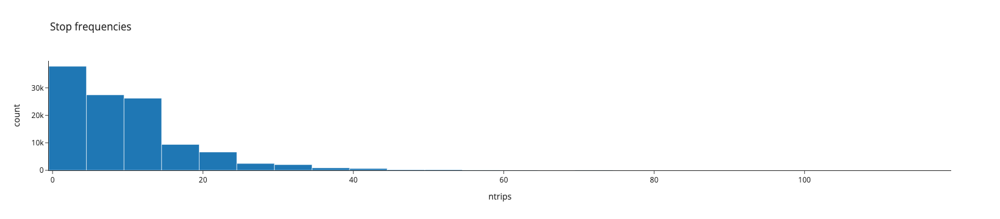

In [8]:
# Histogram
import plotly.express as px

px.histogram(
    stop_freq, x="ntrips", title="Stop frequencies", template="simple_white", nbins=50
)

In [9]:
# Function to extract the start of the time window
def extract_start_time(window):
    start_time_str = window.split("-")[0]
    hours, minutes = map(int, start_time_str.split(":"))
    return hours * 60 + minutes


# Apply the function to create a new column for sorting
stop_freq["start_time"] = stop_freq["window"].apply(extract_start_time)

# Sort by the new "start_time" column
stop_freq = stop_freq.sort_values(by="start_time")

In [44]:
stop_freq.to_file("stop_freq.gpkg", driver="GPKG")

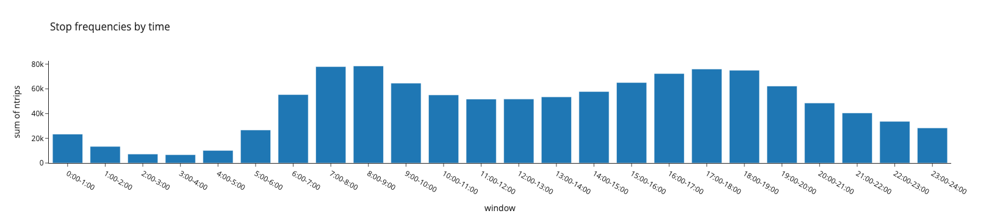

In [10]:
px.histogram(
    stop_freq,
    x="window",
    y="ntrips",
    title="Stop frequencies by time",
    template="simple_white",
)

In [13]:
condition_dir = stop_freq.direction_id == 0
condition_window = stop_freq.window == "8:00-9:00"

gdf = stop_freq.loc[(condition_dir & condition_window), :].reset_index()

map_gdf(
    gdf=gdf,
    variable="ntrips",
    colors=["#d13870", "#e895b3", "#55d992", "#3ab071", "#0e8955", "#066a40"],
    tooltip_var=["min_per_trip"],
    tooltip_labels=["Frequency: "],
    breaks=[10, 20, 30, 40, 120, 200],
)

# Lines Frequencies

In [39]:
lines_freq = feed.lines_freq

In [40]:
lines_freq.head()

,route_id,route_name,direction_id,window,min_per_trip,ntrips,geometry
0,0-M1,M1 Harlem - East Village,0,0:00-1:00,15,4,"LINESTRING (-73.99037 40.73136, -73.99021 40.7..."
1,0-M1,M1 Harlem - East Village,0,10:00-11:00,10,6,"LINESTRING (-73.99037 40.73136, -73.99021 40.7..."
2,0-M1,M1 Harlem - East Village,0,11:00-12:00,15,4,"LINESTRING (-73.99037 40.73136, -73.99021 40.7..."
3,0-M1,M1 Harlem - East Village,0,12:00-13:00,15,4,"LINESTRING (-73.99037 40.73136, -73.99021 40.7..."
4,0-M1,M1 Harlem - East Village,0,13:00-14:00,10,6,"LINESTRING (-73.99037 40.73136, -73.99021 40.7..."


In [41]:
# Apply the function to create a new column for sorting
lines_freq["start_time"] = lines_freq["window"].apply(extract_start_time)

# Sort by the new "start_time" column
lines_freq = lines_freq.sort_values(by="start_time")

NameError: name 'extract_start_time' is not defined

In [24]:
lines_freq.loc[
    lines_freq.route_name == "QM2 Bay Terrace - Midtown Via 6Th Av"
].sort_values(by=["direction_id", "start_time"])

,route_id,route_name,direction_id,window,min_per_trip,ntrips,geometry,start_time
5157,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,8:00-9:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",480
5158,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,9:00-10:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",540
5143,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,10:00-11:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",600
5144,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,11:00-12:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",660
5145,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,12:00-13:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",720
5146,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,13:00-14:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",780
5147,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,14:00-15:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",840
5148,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,15:00-16:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",900
5149,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,16:00-17:00,15,4,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",960
5150,1-QM2,QM2 Bay Terrace - Midtown Via 6Th Av,0,17:00-18:00,6,10,"LINESTRING (-73.98705 40.75079, -73.98683 40.7...",1020


In [42]:
px.histogram(
    lines_freq, x="ntrips", title="Stop frequencies", template="simple_white", nbins=20
)

In [43]:
condition_dir = lines_freq.direction_id == 1
condition_window = lines_freq.window == "7:00-8:00"
gdf = lines_freq.loc[(condition_dir & condition_window), :].reset_index()


In [44]:
gdf.to_file("routes_hour.gpkg", driver="GPKG")

In [26]:


gdf = lines_freq.loc[(condition_dir & condition_window), :].reset_index()

map_gdf(
    gdf=gdf,
    variable="ntrips",
    colors=["#d13870", "#e895b3", "#55d992", "#3ab071", "#0e8955", "#066a40"],
    tooltip_var=["route_name"],
    tooltip_labels=["Route: "],
    breaks=[4, 9, 15, 20],
)

# Segments

In [30]:
segments_gdf = feed.segments
segments_gdf.head(10)

INFO:root:Getting segments...
INFO:root:Reading "shapes.txt".
INFO:root:Projecting stops onto shape...
INFO:root:Interpolating stops onto shape...
INFO:root:Sorting shape points and stops...
INFO:root:segments_df: 14673, geometry: 14673


,shape_id,route_id,route_name,direction_id,stop_sequence,segment_name,start_stop_name,end_stop_name,segment_id,start_stop_id,end_stop_id,distance_m,geometry
0,0-M010064,0-M1,M1 Harlem - East Village,0,1,4 AV/E 10 ST - 4 AV/E 13 ST,4 AV/E 10 ST,4 AV/E 13 ST,0-405527 - 0-400003,0-405527,0-400003,288.866094,"LINESTRING (-73.99037 40.73137, -73.99021 40.7..."
1,0-M010064,0-M1,M1 Harlem - East Village,0,2,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,0-400003 - 0-404120,0-400003,0-404120,194.972175,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."
2,0-M010064,0-M1,M1 Harlem - East Village,0,3,UNION SQ EAST/E 15 ST - PARK AV SOUTH/E 18 ST,UNION SQ EAST/E 15 ST,PARK AV SOUTH/E 18 ST,0-404120 - 0-404936,0-404120,0-404936,161.067007,"LINESTRING (-73.98971 40.73562, -73.98961 40.7..."
3,0-M010064,0-M1,M1 Harlem - East Village,0,4,PARK AV SOUTH/E 18 ST - PARK AV SOUTH/E 21 ST,PARK AV SOUTH/E 18 ST,PARK AV SOUTH/E 21 ST,0-404936 - 0-400007,0-404936,0-400007,276.904383,"LINESTRING (-73.98870 40.73684, -73.98851 40.7..."
4,0-M010064,0-M1,M1 Harlem - East Village,0,5,PARK AV SOUTH/E 21 ST - PARK AV SOUTH/E 23 ST,PARK AV SOUTH/E 21 ST,PARK AV SOUTH/E 23 ST,0-400007 - 0-403782,0-400007,0-403782,191.102206,"LINESTRING (-73.98713 40.73903, -73.98679 40.7..."
5,0-M010064,0-M1,M1 Harlem - East Village,0,6,PARK AV SOUTH/E 23 ST - E 25 ST/PARK AV SOUTH,PARK AV SOUTH/E 23 ST,E 25 ST/PARK AV SOUTH,0-403782 - 0-403316,0-403782,0-403316,130.638627,"LINESTRING (-73.98603 40.74053, -73.98582 40.7..."
6,0-M010064,0-M1,M1 Harlem - East Village,0,7,E 25 ST/PARK AV SOUTH - MADISON AV/E 28 ST,E 25 ST/PARK AV SOUTH,MADISON AV/E 28 ST,0-403316 - 0-405380,0-403316,0-405380,415.327358,"LINESTRING (-73.98552 40.74151, -73.98553 40.7..."
7,0-M010064,0-M1,M1 Harlem - East Village,0,8,MADISON AV/E 28 ST - MADISON AV/E 30 ST,MADISON AV/E 28 ST,MADISON AV/E 30 ST,0-405380 - 0-400352,0-405380,0-400352,165.654037,"LINESTRING (-73.98551 40.74425, -73.98524 40.7..."
8,0-M010064,0-M1,M1 Harlem - East Village,0,9,MADISON AV/E 30 ST - MADISON AV/E 35 ST,MADISON AV/E 30 ST,MADISON AV/E 35 ST,0-400352 - 0-400190,0-400352,0-400190,355.456268,"LINESTRING (-73.98456 40.74556, -73.98434 40.7..."
9,0-M010064,0-M1,M1 Harlem - East Village,0,10,MADISON AV/E 35 ST - MADISON AV/E 37 ST,MADISON AV/E 35 ST,MADISON AV/E 37 ST,0-400190 - 0-400191,0-400190,0-400191,191.162297,"LINESTRING (-73.98252 40.74836, -73.98247 40.7..."


In [31]:
segments_freq = feed.segments_freq
segments_freq.head()

INFO:root:adding data for all lines.


,route_id,route_name,direction_id,segment_name,start_stop_name,end_stop_name,window,min_per_trip,ntrips,start_stop_id,end_stop_id,segment_id,geometry
0,0-M1,M1 Harlem - East Village,0,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,0:00-1:00,15,4,0-400003,0-404120,0-400003 - 0-404120,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."
1,0-M1,M1 Harlem - East Village,0,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,10:00-11:00,5,12,0-400003,0-404120,0-400003 - 0-404120,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."
2,0-M1,M1 Harlem - East Village,0,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,11:00-12:00,6,10,0-400003,0-404120,0-400003 - 0-404120,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."
3,0-M1,M1 Harlem - East Village,0,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,12:00-13:00,6,10,0-400003,0-404120,0-400003 - 0-404120,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."
4,0-M1,M1 Harlem - East Village,0,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,13:00-14:00,6,10,0-400003,0-404120,0-400003 - 0-404120,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."


In [35]:
segments_hour_dir = segments_freq.loc[(segments_freq.window == "7:00-8:00")&  (segments_freq.direction_id == 1)]

In [36]:
segments_hour_dir.shape

(4073, 13)

In [38]:
segments_hour_dir.to_file("segments_hour_dir.gpkg", driver="GPKG")

# Speeds

In [77]:
speeds = feed.avg_speeds
speeds.head(1)

INFO:root:Getting segments...
INFO:root:Reading "shapes.txt".
INFO:root:Projecting stops onto shape...
INFO:root:Interpolating stops onto shape...
INFO:root:Sorting shape points and stops...
INFO:root:segments_df: 14673, geometry: 14673
INFO:root:adding runtime
INFO:root:adding distance in meters
INFO:root:calculating speed in km/h
INFO:root:fixing outliers
INFO:root:aggregating speed by segment and window


,route_id,route_name,direction_id,stop_sequence,segment_name,window,speed_kmh,avg_route_speed_kmh,segment_max_speed_kmh,runtime_sec,start_stop_name,end_stop_name,segment_id,start_stop_id,end_stop_id,shape_id,distance_m,geometry
0,0-M1,M1 Harlem - East Village,0,1,4 AV/E 10 ST - 4 AV/E 13 ST,0:00-1:00,14.0,17.9,14.0,73.0,4 AV/E 10 ST,4 AV/E 13 ST,0-405527 - 0-400003,0-405527,0-400003,0-M010064,288.866094,"LINESTRING (-73.99037 40.73137, -73.99021 40.7..."


In [80]:
speeds

,route_id,route_name,direction_id,stop_sequence,segment_name,window,speed_kmh,avg_route_speed_kmh,segment_max_speed_kmh,runtime_sec,start_stop_name,end_stop_name,segment_id,start_stop_id,end_stop_id,shape_id,distance_m,geometry
0,0-M1,M1 Harlem - East Village,0,1,4 AV/E 10 ST - 4 AV/E 13 ST,0:00-1:00,14.0,17.9000,14.0,73.000,4 AV/E 10 ST,4 AV/E 13 ST,0-405527 - 0-400003,0-405527,0-400003,0-M010064,288.866094,"LINESTRING (-73.99037 40.73137, -73.99021 40.7..."
1,0-M1,M1 Harlem - East Village,0,2,4 AV/E 13 ST - UNION SQ EAST/E 15 ST,0:00-1:00,14.0,17.9000,15.0,49.000,4 AV/E 13 ST,UNION SQ EAST/E 15 ST,0-400003 - 0-404120,0-400003,0-404120,0-M010064,194.972175,"LINESTRING (-73.98985 40.73394, -73.98985 40.7..."
2,0-M1,M1 Harlem - East Village,0,3,UNION SQ EAST/E 15 ST - PARK AV SOUTH/E 18 ST,0:00-1:00,14.0,17.9000,14.0,41.000,UNION SQ EAST/E 15 ST,PARK AV SOUTH/E 18 ST,0-404120 - 0-404936,0-404120,0-404936,0-M010064,161.067007,"LINESTRING (-73.98971 40.73562, -73.98961 40.7..."
3,0-M1,M1 Harlem - East Village,0,4,PARK AV SOUTH/E 18 ST - PARK AV SOUTH/E 21 ST,0:00-1:00,14.0,17.9000,14.0,70.000,PARK AV SOUTH/E 18 ST,PARK AV SOUTH/E 21 ST,0-404936 - 0-400007,0-404936,0-400007,0-M010064,276.904383,"LINESTRING (-73.98870 40.73684, -73.98851 40.7..."
4,0-M1,M1 Harlem - East Village,0,5,PARK AV SOUTH/E 21 ST - PARK AV SOUTH/E 23 ST,0:00-1:00,14.0,17.9000,14.0,49.000,PARK AV SOUTH/E 21 ST,PARK AV SOUTH/E 23 ST,0-400007 - 0-403782,0-400007,0-403782,0-M010064,191.102206,"LINESTRING (-73.98713 40.73903, -73.98679 40.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384881,ALL_LINES,All lines,NA,63,BROADWAY/WEST HOUSTON ST - BROADWAY/PRINCE ST,9:00-10:00,14.6,9.8625,21.0,40.375,BROADWAY/WEST HOUSTON ST,BROADWAY/PRINCE ST,0-403311 - 0-404916,0-403311,0-404916,0-M010066,149.216392,"LINESTRING (-73.99707 40.72508, -73.99737 40.7..."
384882,ALL_LINES,All lines,NA,64,BROADWAY/PRINCE ST - BROADWAY/SPRING ST,9:00-10:00,14.0,9.8625,21.0,42.375,BROADWAY/PRINCE ST,BROADWAY/SPRING ST,0-404916 - 0-400157,0-404916,0-400157,0-M010066,153.860819,"LINESTRING (-73.99799 40.72393, -73.99820 40.7..."
384883,ALL_LINES,All lines,NA,65,BROADWAY/SPRING ST - CENTRE ST/GRAND ST,9:00-10:00,17.2,10.2000,21.0,126.600,BROADWAY/SPRING ST,CENTRE ST/GRAND ST,0-400157 - 0-404823,0-400157,0-404823,0-M010066,563.366770,"LINESTRING (-73.99897 40.72277, -73.99927 40.7..."
384884,ALL_LINES,All lines,NA,70,5 AV/W 38 ST - 5 AV/W 36 ST,9:00-10:00,8.0,9.9000,22.0,74.000,5 AV/W 38 ST,5 AV/W 36 ST,0-400519 - 0-405486,0-400519,0-405486,0-M040117,170.111229,"LINESTRING (-73.98276 40.75089, -73.98318 40.7..."


In [81]:
speeds_hour = speeds.loc[(speeds.window == "7:00-8:00") & (speeds.direction_id == 1)]

In [82]:
speeds_hour

,route_id,route_name,direction_id,stop_sequence,segment_name,window,speed_kmh,avg_route_speed_kmh,segment_max_speed_kmh,runtime_sec,start_stop_name,end_stop_name,segment_id,start_stop_id,end_stop_id,shape_id,distance_m,geometry
5812,0-M1,M1 Harlem - East Village,1,1,MALCOLM X BLVD/W 146 ST - MALCOLM X BLVD/W 145 ST,7:00-8:00,7.9,12.1,12.000000,40.777778,MALCOLM X BLVD/W 146 ST,MALCOLM X BLVD/W 145 ST,0-405284 - 0-400088,0-405284,0-400088,0-M010066,93.523617,"LINESTRING (-73.93586 40.82105, -73.93631 40.8..."
5813,0-M1,M1 Harlem - East Village,1,1,MALCOLM X BLVD/W 146 ST - MALCOLM X BLVD/W 145 ST,7:00-8:00,7.9,12.1,12.000000,40.777778,MALCOLM X BLVD/W 146 ST,MALCOLM X BLVD/W 145 ST,0-405284 - 0-400088,0-405284,0-400088,0-M010067,93.523617,"LINESTRING (-73.93586 40.82105, -73.93631 40.8..."
5814,0-M1,M1 Harlem - East Village,1,1,MALCOLM X BLVD/W 146 ST - MALCOLM X BLVD/W 145 ST,7:00-8:00,7.9,12.1,12.000000,40.777778,MALCOLM X BLVD/W 146 ST,MALCOLM X BLVD/W 145 ST,0-405284 - 0-400088,0-405284,0-400088,0-M010073,93.523617,"LINESTRING (-73.93586 40.82105, -73.93631 40.8..."
5815,0-M1,M1 Harlem - East Village,1,2,MALCOLM X BLVD/W 145 ST - MALCOLM X BLVD/W 142 ST,7:00-8:00,8.2,12.1,15.000000,117.111111,MALCOLM X BLVD/W 145 ST,MALCOLM X BLVD/W 142 ST,0-400088 - 0-400089,0-400088,0-400089,0-M010066,268.468590,"LINESTRING (-73.93641 40.82032, -73.93642 40.8..."
5816,0-M1,M1 Harlem - East Village,1,2,MALCOLM X BLVD/W 145 ST - MALCOLM X BLVD/W 142 ST,7:00-8:00,8.2,12.1,15.000000,117.111111,MALCOLM X BLVD/W 145 ST,MALCOLM X BLVD/W 142 ST,0-400088 - 0-400089,0-400088,0-400089,0-M010067,268.468590,"LINESTRING (-73.93641 40.82032, -73.93642 40.8..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268225,1-QM8,QM8 Glen Oaks - Downtown,1,36,WATER ST/BROAD ST - STATE ST/BATTERY PL,7:00-8:00,7.0,20.9,16.000000,239.000000,WATER ST/BROAD ST,STATE ST/BATTERY PL,1-405399 - 1-450203,1-405399,1-450203,1-QM80150,470.195321,"LINESTRING (-74.01129 40.70303, -74.01152 40.7..."
268226,1-QM8,QM8 Glen Oaks - Downtown,1,37,STATE ST/BATTERY PL - TRINITY PL/THAMES ST,7:00-8:00,7.0,20.9,16.000000,266.000000,STATE ST/BATTERY PL,TRINITY PL/THAMES ST,1-450203 - 1-450378,1-450203,1-450378,1-QM80150,525.015631,"LINESTRING (-74.01427 40.70441, -74.01424 40.7..."
268227,1-QM8,QM8 Glen Oaks - Downtown,1,38,TRINITY PL/THAMES ST - CHURCH ST/VESEY ST,7:00-8:00,7.0,20.9,16.000000,230.000000,TRINITY PL/THAMES ST,CHURCH ST/VESEY ST,1-450378 - 1-405060,1-450378,1-405060,1-QM80150,452.649561,"LINESTRING (-74.01263 40.70832, -74.01233 40.7..."
268228,1-QM8,QM8 Glen Oaks - Downtown,1,39,CHURCH ST/VESEY ST - PARK ROW/BEEKMAN ST,7:00-8:00,8.0,20.9,16.000000,132.000000,CHURCH ST/VESEY ST,PARK ROW/BEEKMAN ST,1-405060 - 1-401165,1-405060,1-401165,1-QM80150,297.698469,"LINESTRING (-74.01021 40.71195, -74.01014 40.7..."


In [83]:
speeds_hour.to_file("speeds_hour_dir.gpkg", driver="GPKG")